In [1]:
import json
from typing import List

import numpy as np
import pandas as pd
from tqdm.notebook import tqdm
from rich import print
import matplotlib.pyplot as plt

from src.blip_modules.blip_text_encoder import BLIPTextEncoder
from src.blip_modules.blip_img_encoder import BLIPImgEncoder
from src.data_utils import targetpad_transform
from src.cirr_experiment.utils import element_wise_sum_original, get_combing_function_with_alpha, \
    convert_to_pivot_cirr, prepare_and_plot_recall_pivot, prepare_ground_truths, plot_retrieval_results_of_i, \
    found_better_than_original
from src.cirr_experiment.validate_notebook import cirr_val_retrieval_text_image_grid_search, compute_results_cirr_val
from src.utils import device

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 1: Set up the experiment</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Set up the cache for the experiment</div>

In [2]:
cache = {}

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Same concept as script version here</div>

In [3]:
BLIP_PRETRAINED_PATH = '../../../models/model_large_retrieval_coco.pth'
MED_CONFIG_PATH = '../../blip_modules/med_config_large.json'

In [4]:
blip_text_encoder = BLIPTextEncoder(
    BLIP_PRETRAINED_PATH, 
    MED_CONFIG_PATH,
    use_pretrained_proj_layer=True,
    vit='large',
)

blip_text_encoder = blip_text_encoder.to(device)
print("blip text encoder loaded.")
blip_text_encoder.eval()

load checkpoint from ../../../models/model_large_retrieval_coco.pth for text_encoder.
load checkpoint from ../../../models/model_large_retrieval_coco.pth for text_proj.


blip text encoder loaded.

BLIPTextEncoder(
  (text_encoder): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30524, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
              (dropout): Drop

In [5]:
blip_img_encoder = BLIPImgEncoder(BLIP_PRETRAINED_PATH, vit='large')
blip_img_encoder = blip_img_encoder.to(device)
print("blip img encoder loaded.")
blip_img_encoder.eval()

load checkpoint from ../../../models/model_large_retrieval_coco.pth for visual_encoder.
load checkpoint from ../../../models/model_large_retrieval_coco.pth for vision_proj.


blip img encoder loaded.

BLIPImgEncoder(
  (visual_encoder): VisionTransformer(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 1024, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0): Block(
        (norm1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=1024, out_features=3072, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=1024, out_features=1024, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=1024, out_features=4096, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=4096, out_features=1024, bias=True)
          (drop): Dropout(p=0.0, inplace=False)
      

In [6]:
print('Target pad preprocess pipeline is used')
preprocess = targetpad_transform(1.25, 384)

Target pad preprocess pipeline is used

In [7]:
combining_function_original = element_wise_sum_original

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 2: Load the MLLM generated text captions</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Load the addition text captions</div>

In [8]:
with open('../../../cirr_dataset/cirr_labeled_images_cir_cleaned.json', 'r') as f:
    text_captions = json.load(f)
    
print(f'Total number of text captions: {len(text_captions)}')

Total number of text captions: 4609

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 3: Perform retrieval on the CIRR dataset</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Perform retrieval</div>

In [9]:
grid_search_alphas = np.arange(0, 1.05, 0.05)
total_result: List[pd.DataFrame] = []

for alpha in tqdm(grid_search_alphas, desc="Grid Search alphas and betas"):
    result = cirr_val_retrieval_text_image_grid_search(
        get_combing_function_with_alpha(alpha),
        blip_text_encoder,
        blip_img_encoder,
        text_captions,
        preprocess,
        cache=cache,
    )
    
    total_result.append(result)

recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3 = convert_to_pivot_cirr(total_result)

Grid Search alphas and betas:   0%|          | 0/21 [00:00<?, ?it/s]

In [10]:
display(recall_at1, recall_at5, recall_at10, recall_at50, group_recall_at1, group_recall_at2, group_recall_at3)

alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,7.318823,7.318823,7.342741,7.366659,7.438412,7.510165,7.629754,7.677589,7.725424,7.749342,...,7.916766,8.012437,8.227697,8.419038,8.706051,9.088735,10.165032,13.298254,23.989476,34.154508
0.05,7.462329,7.486247,7.534083,7.558001,7.558001,7.653672,7.749342,7.773260,7.892849,8.012437,...,8.251614,8.323368,8.371203,8.777805,8.945228,9.543172,10.930400,14.231046,25.472376,34.345850
0.10,7.558001,7.581918,7.629754,7.701506,7.677589,7.629754,7.749342,7.845013,7.821096,7.964602,...,8.347286,8.490792,8.777805,8.993064,9.447501,10.188950,11.743602,15.618274,26.787850,34.513274
0.15,7.558001,7.629754,7.653672,7.749342,7.797178,7.868931,7.988519,8.036355,8.275532,8.419038,...,8.801722,9.184406,9.256159,9.686678,10.093279,11.026070,12.652476,16.670653,28.198996,34.202343
0.20,7.534083,7.629754,7.653672,7.749342,7.821096,7.940684,8.060273,8.203779,8.395121,8.562545,...,9.160488,9.471418,9.806266,10.260703,10.834728,11.863191,13.585266,17.818704,29.155704,33.484814
0.25,7.629754,7.653672,7.701506,7.845013,7.964602,8.084191,8.347286,8.442956,8.466874,8.825640,...,9.638842,10.141115,10.332456,10.954317,11.863191,12.772064,14.781153,19.421192,29.921073,32.552022
0.30,7.438412,7.534083,7.629754,7.845013,7.916766,8.060273,8.347286,8.466874,8.897393,9.184406,...,9.973691,10.380292,10.834728,11.647931,12.461134,13.657020,16.240133,20.832337,30.925617,32.097584
0.35,7.342741,7.438412,7.534083,7.821096,7.916766,8.108108,8.347286,8.586463,8.945228,9.232241,...,10.188950,10.834728,11.600096,12.174121,13.011241,15.139918,17.268597,21.741210,31.140876,30.997369
0.40,7.175317,7.247070,7.558001,7.653672,7.821096,8.060273,8.442956,8.586463,8.969146,9.280077,...,10.475963,11.360919,12.054533,12.819900,14.278881,16.048792,18.512318,22.745755,31.045204,29.681894


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,26.668262,26.716095,26.763931,26.787850,26.883522,27.074862,27.266204,27.385792,27.529299,27.648887,...,28.127241,28.462091,29.036117,29.753646,30.829945,32.169336,35.135135,40.779719,55.800050,59.579051
0.05,26.620427,26.763931,26.859602,27.027026,27.194452,27.242288,27.553216,27.601051,28.031573,28.246832,...,28.940445,29.370964,29.849318,30.758193,32.121503,33.795741,36.450610,42.573547,57.450372,60.057402
0.10,26.787850,26.883522,27.003109,27.242288,27.505383,27.768478,27.959818,28.198996,28.390336,28.677350,...,29.753646,30.423343,31.140876,32.121503,33.436978,35.159051,38.292274,44.367376,59.148526,60.487920
0.15,26.787850,27.027026,27.218369,27.457547,27.768478,28.055489,28.390336,28.725186,29.203540,29.634058,...,30.782109,31.427887,32.025832,33.436978,34.752452,36.905047,40.110022,46.687394,60.440087,60.200912
0.20,26.692179,26.883522,27.194452,27.529299,27.768478,27.959818,28.342500,28.820857,29.610142,29.968908,...,31.523558,32.360679,33.604401,34.632862,36.283186,38.651040,42.310452,49.031332,61.516386,59.866059
0.25,26.524755,26.596507,26.979190,27.337956,27.864146,28.246832,28.701267,29.203540,30.016741,30.638602,...,32.432431,33.604401,34.872040,36.044008,38.244438,40.684047,44.295624,50.825161,62.186080,59.268117
0.30,26.357332,26.644343,27.146617,27.361876,27.816311,28.486007,29.251376,29.801482,30.566850,31.380051,...,33.389142,34.824204,36.331022,37.933508,39.751256,42.573547,46.424299,52.475482,62.664437,58.383161
0.35,26.165989,26.524755,26.835686,27.481464,27.840230,28.366420,29.275292,30.208084,31.188712,32.025832,...,34.680697,36.450610,38.029179,39.894763,41.975603,44.582635,48.218131,53.934467,62.616599,57.880890
0.40,25.831142,26.165989,26.668262,27.242288,27.840230,28.414255,29.347047,30.351591,31.571394,32.623774,...,35.828748,37.550825,39.512077,41.640756,44.056445,46.615642,49.940205,55.536956,62.353504,56.732839


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,38.124850,38.196602,38.316193,38.507533,38.603204,38.866299,38.985887,39.320737,39.607748,39.870843,...,40.636212,41.138485,41.856015,42.812723,44.223869,46.328628,49.629274,56.015307,70.796460,69.648409
0.05,38.507533,38.579288,38.674960,38.938054,39.248982,39.512077,39.775175,40.062186,40.444869,40.684047,...,41.736427,42.406124,43.434584,44.534799,45.802438,47.787610,51.399189,58.239657,72.183686,70.078927
0.10,38.627124,38.818464,39.177230,39.488161,39.703420,40.014350,40.397033,40.755799,41.210237,41.832098,...,43.147573,43.936858,44.941401,45.993781,47.596270,49.724945,53.743124,60.440087,73.499161,70.342022
0.15,38.507533,39.057642,39.320737,39.631668,40.014350,40.444869,40.947142,41.569003,42.119110,42.908394,...,44.582635,45.324084,46.304712,47.763693,49.366179,51.781869,55.632621,62.090409,74.431956,70.485532
0.20,38.674960,38.985887,39.392489,39.823008,40.468788,41.018894,41.497248,42.190865,42.740971,43.649843,...,45.515427,46.830902,47.668022,49.318346,51.423103,53.886628,57.761300,64.123416,75.029898,70.294189
0.25,38.722792,39.057642,39.440325,39.870843,40.612292,41.353744,42.023438,42.836642,43.793350,44.463047,...,46.783066,47.931117,49.533606,51.423103,53.432190,56.326240,59.913898,65.558481,75.340825,70.031095
0.30,38.316193,38.746712,39.296818,39.823008,40.636212,41.449413,42.406124,43.195409,44.295624,45.611098,...,48.218131,49.581441,51.518774,53.312606,55.584788,58.215737,61.468548,67.400146,75.077730,69.720161
0.35,37.885672,38.459697,39.105478,39.846927,40.660128,41.473332,42.214781,43.458503,44.965318,46.448219,...,49.724945,51.542693,53.145182,55.034679,57.115525,59.531212,63.214540,68.906963,74.384117,68.715620
0.40,37.359482,37.957427,38.531452,39.201149,40.110022,41.138485,42.453960,43.841186,45.467591,47.165748,...,50.944752,52.714664,54.604161,56.230569,58.502752,61.468548,64.745277,69.217891,74.001437,67.471898


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,66.347766,66.443437,66.515189,66.658694,66.921788,67.065293,67.328387,67.543650,67.806745,68.356854,...,69.457066,70.270270,71.203059,72.422868,74.336284,76.775891,80.124372,84.931833,91.509211,86.677825
0.05,66.610861,66.921788,67.160964,67.424059,67.758912,68.117678,68.572110,69.122219,69.624490,70.126766,...,71.131307,72.064102,73.331738,74.623299,76.177949,78.593636,81.894284,86.151636,91.987562,86.917007
0.10,67.304474,67.519730,68.093759,68.572110,68.859124,69.385314,70.031095,70.485532,71.179146,71.777087,...,73.212153,74.121022,75.269073,76.704139,78.378379,80.602729,83.425015,87.514949,92.154986,87.084430
0.15,67.543650,68.141592,68.643868,69.361395,69.863671,70.461613,70.987803,71.777087,72.327197,73.020810,...,74.886394,76.177949,77.326000,78.832817,80.339634,82.587898,84.716576,88.112891,92.489833,87.204015
0.20,67.615402,68.285102,69.026548,70.031095,70.652956,71.203059,72.111934,72.781628,73.762256,74.766803,...,76.656300,78.019613,79.335088,80.530971,82.181299,83.688110,85.912460,88.854343,92.657256,87.323606
0.25,67.495817,68.404686,69.146138,70.031095,71.250898,72.111934,72.996891,74.001437,75.005978,76.034439,...,78.593636,79.813445,80.985409,82.348722,83.425015,84.788328,87.132263,89.643627,92.633343,86.940920
0.30,67.184883,68.380773,69.265723,70.437694,71.585745,72.853386,73.714423,74.862474,76.106197,77.254248,...,80.124372,81.224585,82.468307,83.377182,84.644824,85.840708,87.825876,90.145898,92.633343,86.677825
0.35,67.137051,68.141592,69.337481,70.652956,71.992344,73.164314,74.336284,75.771344,77.086824,78.569722,...,81.057161,82.300884,83.448935,84.333891,85.314518,86.893088,88.495576,90.528584,92.394161,86.390817
0.40,66.634774,67.950249,69.337481,70.629036,71.920592,73.403490,75.173402,76.632386,78.019613,79.454678,...,81.942117,83.161920,84.094715,85.075343,86.319065,87.658453,89.117438,90.672088,92.298496,85.936379


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,20.928007,20.975843,20.999761,21.023679,21.143267,21.191102,21.358527,21.502033,21.669456,21.836881,...,22.386989,22.913179,23.511122,24.085148,25.041857,26.596507,29.370964,35.039464,49.844536,72.733796
0.05,20.712748,20.832337,20.951925,21.023679,21.119349,21.215020,21.382445,21.549869,21.836881,22.219564,...,23.224109,23.702464,24.348243,25.209281,26.237741,28.079405,31.021288,36.737624,51.470941,72.733796
0.10,20.545325,20.688830,20.999761,21.286774,21.502033,21.693374,21.884717,22.195648,22.530495,22.984932,...,24.228653,24.922268,25.591964,26.285577,27.505383,29.490551,32.839033,38.842383,53.049511,72.901219
0.15,20.736666,20.880172,21.095432,21.382445,21.669456,22.004305,22.458743,22.817507,23.535040,24.061230,...,25.328869,25.974646,26.740015,27.816311,29.107869,31.403971,34.537193,40.875387,54.532409,72.781628
0.20,20.784502,20.975843,21.215020,21.597704,21.956469,22.578330,23.056684,23.630710,24.204735,24.826597,...,26.285577,27.098781,28.294668,29.442716,30.925617,33.293471,36.307102,42.788807,56.230569,72.638124
0.25,20.999761,21.286774,21.573786,21.980387,22.602248,23.224109,23.822053,24.348243,24.874432,25.687635,...,27.672806,28.868693,29.825401,30.997369,32.647693,35.039464,38.435781,44.821814,57.617795,72.446781
0.30,21.167184,21.549869,21.956469,22.530495,22.817507,23.487204,24.132982,24.826597,25.902894,26.692179,...,28.773022,29.944989,31.236547,32.575938,34.250179,36.594117,40.540540,46.232960,58.741927,71.729249
0.35,21.191102,21.549869,21.980387,22.674002,23.295863,23.917723,24.707007,25.639799,26.596507,27.385792,...,29.849318,31.284383,32.791197,34.106672,35.804832,38.746712,42.214781,48.313800,59.435540,71.059555
0.40,21.238938,21.717292,22.434825,23.104520,23.702464,24.204735,25.304952,26.381248,27.433628,28.127241,...,31.380051,32.695529,34.058839,35.709161,38.292274,40.803635,44.223869,50.251138,60.248744,70.413774


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,41.305909,41.401580,41.473332,41.569003,41.712508,41.999522,42.238697,42.477876,42.836642,43.147573,...,44.247788,45.013154,45.826358,47.141832,48.696485,50.801241,54.077971,60.511839,73.475248,87.227935
0.05,41.353744,41.545084,41.784263,41.999522,42.190865,42.573547,43.004066,43.530256,43.841186,44.367376,...,45.635015,46.209040,47.309256,48.624730,50.203300,52.642906,55.728292,62.090409,74.790722,87.467110
0.10,41.329825,41.736427,42.119110,42.501795,42.884478,43.291080,43.769434,44.295624,44.989237,45.419756,...,47.070080,48.098540,48.839989,50.370723,52.308059,54.125810,57.689548,63.645059,75.890934,87.275773
0.15,41.473332,41.951686,42.238697,42.812723,43.267161,43.865106,44.415212,45.132744,45.874193,46.687394,...,48.457307,49.294427,50.538146,52.068883,54.006219,56.182730,59.268117,65.486723,77.158576,87.443197
0.20,41.497248,41.951686,42.477876,43.291080,43.841186,44.295624,45.228416,46.017700,47.093996,47.883281,...,49.820617,51.255679,52.499402,54.006219,55.489117,58.096147,61.683810,67.328387,77.923942,87.156183
0.25,41.784263,42.453960,43.147573,43.865106,44.702223,45.204496,46.232960,47.237504,48.242047,49.270511,...,51.590526,52.834249,54.101890,55.776131,57.737386,60.487920,63.501555,69.289643,78.689307,87.132263
0.30,41.856015,42.477876,43.362832,44.223869,45.132744,46.256876,47.237504,48.313800,49.533606,50.729489,...,52.929920,54.030138,55.584788,57.522124,59.842145,61.994737,65.797657,70.987803,79.119825,86.749583
0.35,41.784263,42.645299,43.410668,44.463047,45.778522,46.854821,48.002869,49.198756,50.633818,51.710117,...,54.699832,55.895716,57.737386,59.650803,61.492467,64.195168,67.208803,72.375029,79.311168,86.606073
0.40,41.569003,42.669219,43.554175,44.702223,45.850274,47.452763,48.744321,49.677110,50.920832,52.642906,...,55.943555,57.737386,59.459460,61.229372,63.190627,65.773737,69.098300,73.618752,79.861277,86.079884


alpha,0.00,0.05,0.10,0.15,0.20,0.25,0.30,0.35,0.40,0.45,...,0.55,0.60,0.65,0.70,0.75,0.80,0.85,0.90,0.95,1.00
beta,,,,,,,,,,,,,,,,,,,,,
0.00,61.277205,61.372876,61.516386,61.612052,61.731642,61.875147,62.233913,62.449175,62.736189,63.358051,...,64.458263,65.199715,66.036832,66.945708,68.859124,70.676869,73.570913,78.928488,86.940920,93.518299
0.05,61.253291,61.372876,61.564219,61.755562,62.162161,62.497008,62.927532,63.358051,63.597226,64.195168,...,65.462810,66.180342,67.280555,68.787372,70.126766,72.303277,74.982059,80.172205,87.706292,93.398708
0.10,61.277205,61.540300,61.946905,62.353504,62.879694,63.310212,63.812482,64.314759,64.960533,65.534562,...,66.993541,67.878497,68.883044,70.270270,71.585745,73.475248,76.321453,81.009328,88.639081,93.470460
0.15,61.325043,61.970818,62.520927,63.023198,63.525474,63.955992,64.482182,65.295386,65.989000,66.610861,...,68.763453,69.480985,70.461613,71.657497,73.020810,75.125569,77.828270,82.133460,89.404446,93.542212
0.20,61.396796,61.970818,62.616599,63.238460,63.955992,64.649606,65.534562,66.443437,67.113131,67.639321,...,69.648409,70.676869,71.753168,72.949058,74.288446,76.536715,79.478592,83.090168,89.619708,93.470460
0.25,61.396796,62.138242,62.784022,63.645059,64.482182,65.295386,66.443437,67.256635,67.974168,68.739533,...,70.844299,72.016263,73.331738,74.408036,76.177949,78.091365,80.530971,84.286058,89.954555,93.542212
0.30,61.348957,62.090409,62.975365,63.788569,64.769197,65.917248,66.969627,67.902416,68.859124,69.672328,...,72.111934,73.451328,74.671131,76.058358,77.589095,79.502511,81.726861,85.386270,89.906722,93.637884
0.35,61.325043,62.162161,63.262379,64.266920,65.414971,66.563022,67.543650,68.596029,69.720161,70.844299,...,73.523080,74.647212,75.914854,77.565175,79.239416,80.770153,82.779241,86.055970,89.811051,93.637884
0.40,61.205453,62.186080,63.405883,64.506102,65.773737,67.089212,68.356854,69.433153,70.844299,72.040182,...,74.264532,75.795263,77.684766,79.119825,80.148292,81.774694,83.712029,86.653912,90.026307,93.446547


# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 4: Plot the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Configure the plot style</div>

In [11]:
plt.style.use('seaborn-whitegrid')
pd.options.display.float_format = '{:.2f}'.format

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the recall results</div>

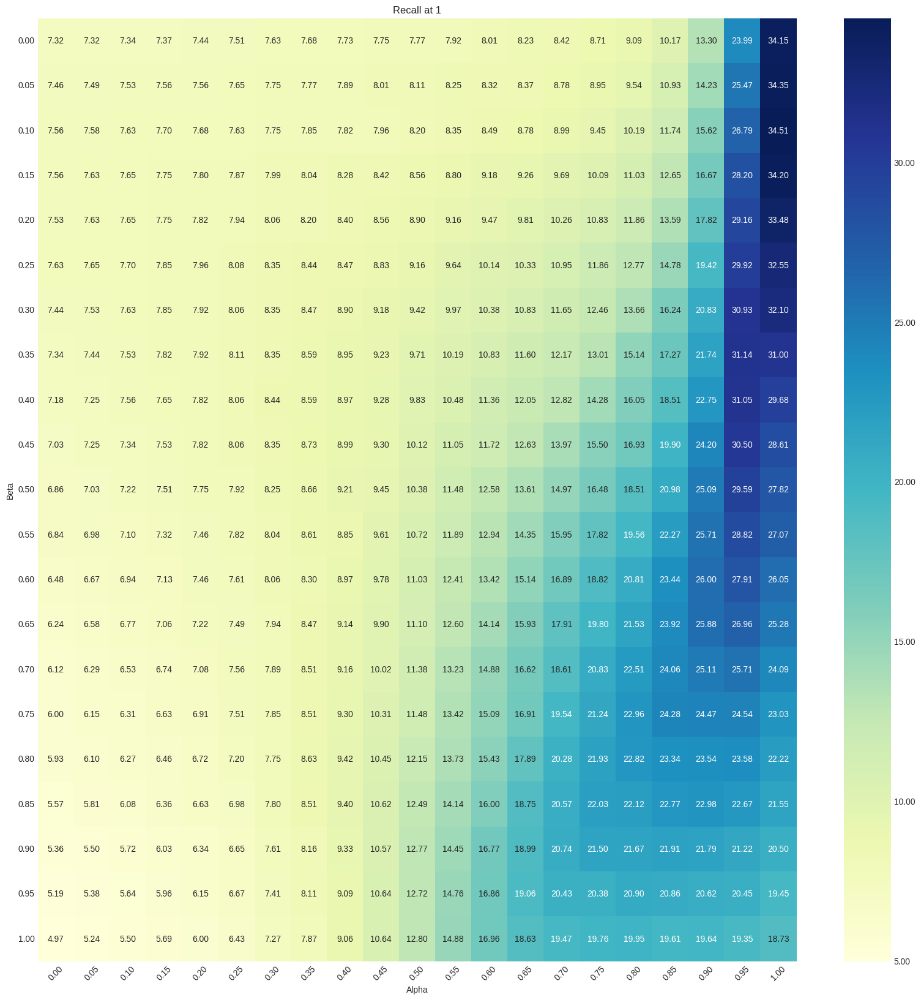

In [12]:
prepare_and_plot_recall_pivot(recall_at1, 'Recall at 1')

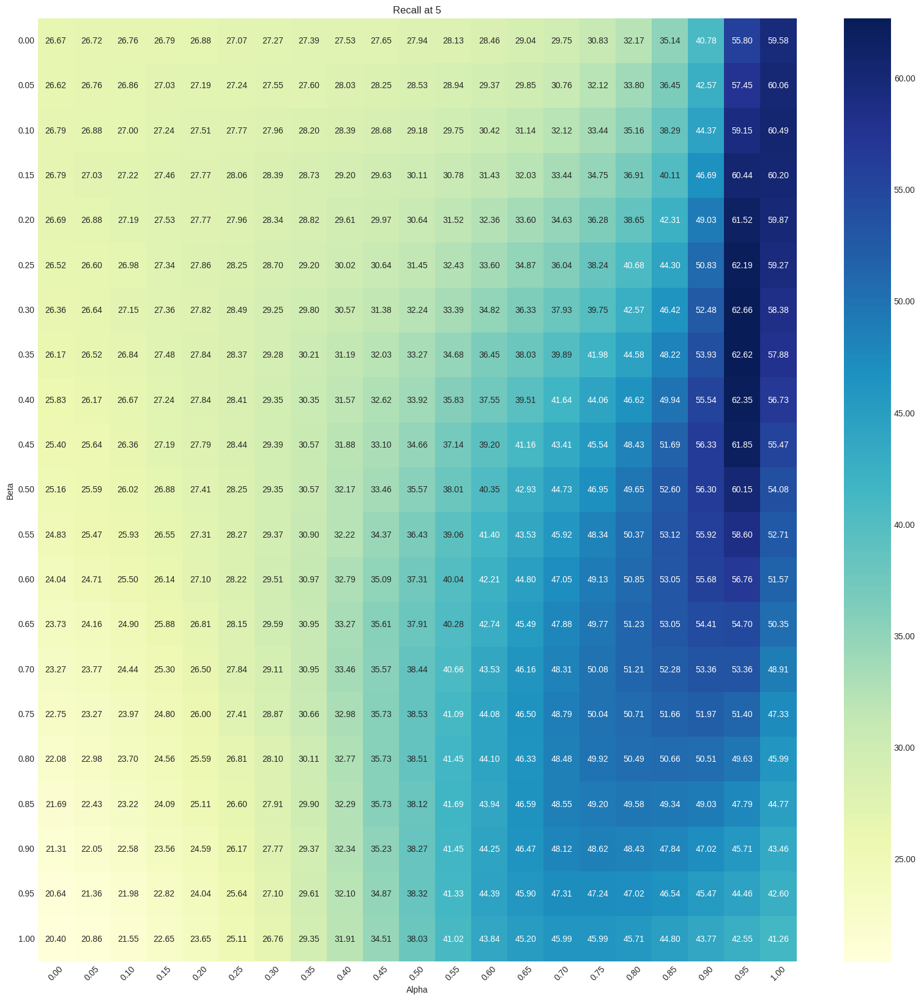

In [13]:
prepare_and_plot_recall_pivot(recall_at5, 'Recall at 5')

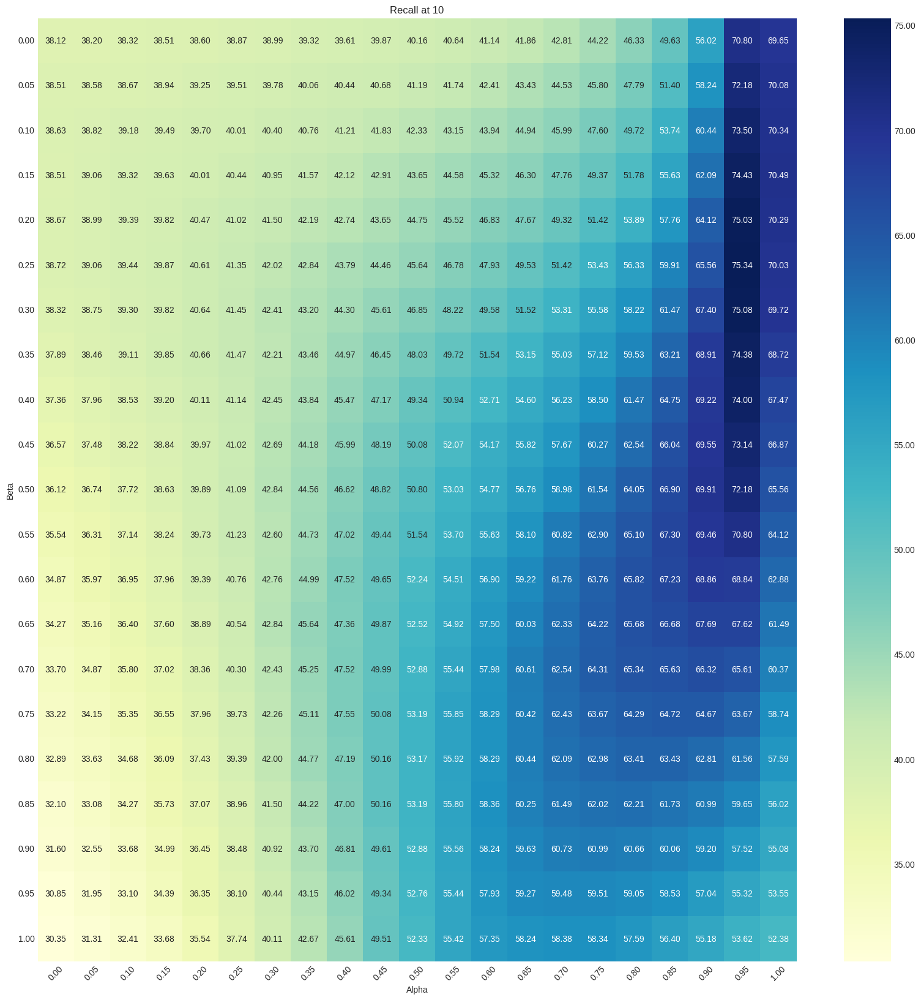

In [14]:
prepare_and_plot_recall_pivot(recall_at10, 'Recall at 10')

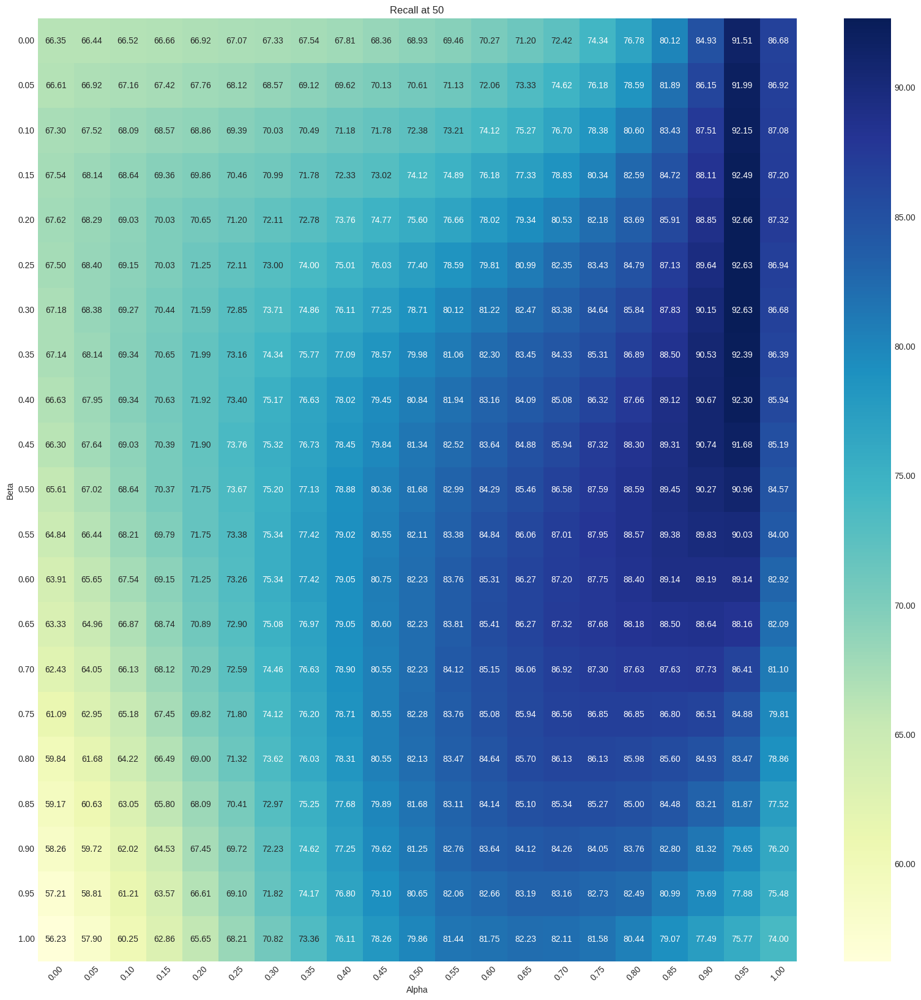

In [15]:
prepare_and_plot_recall_pivot(recall_at50, 'Recall at 50')

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Plot the group recall results</div>

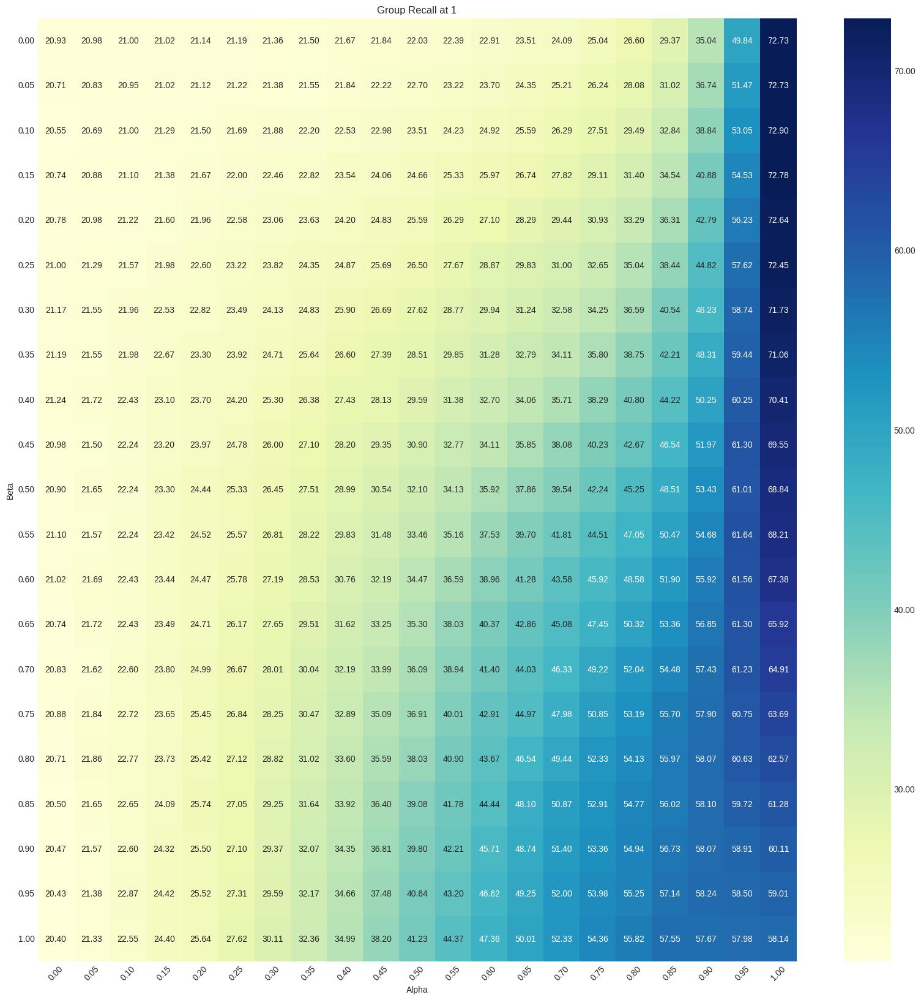

In [16]:
prepare_and_plot_recall_pivot(group_recall_at1, 'Group Recall at 1')

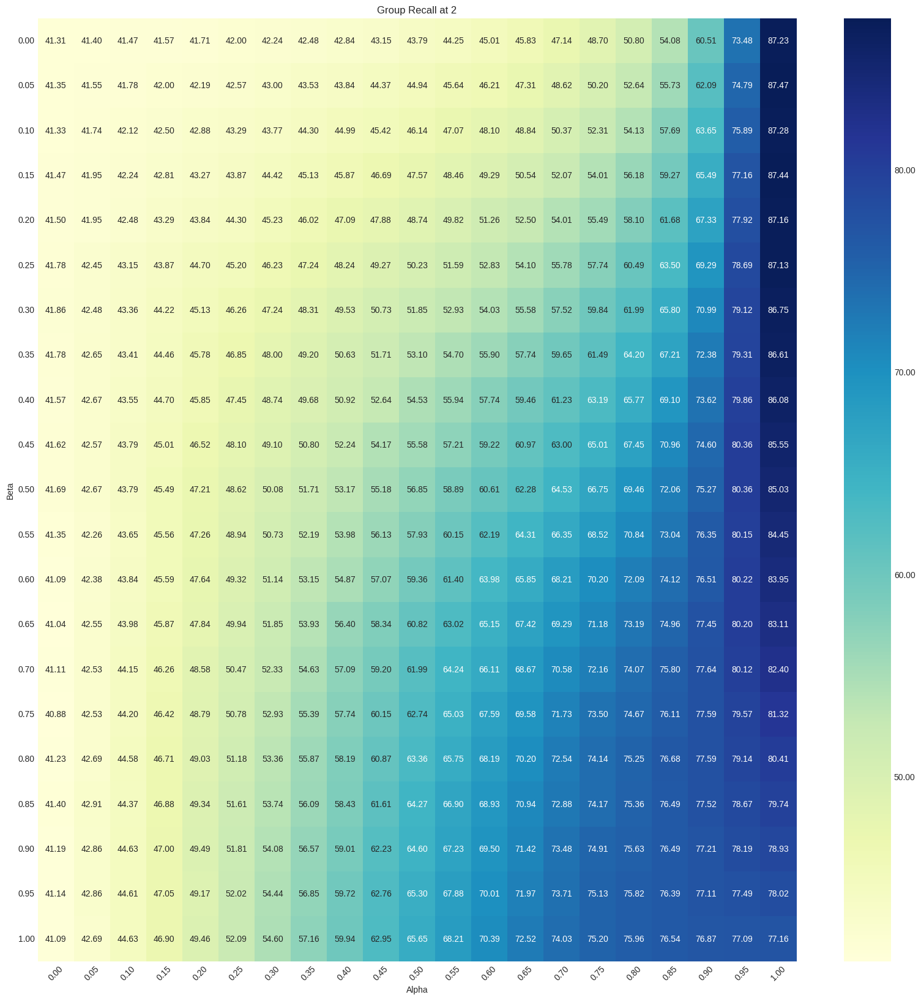

In [17]:
prepare_and_plot_recall_pivot(group_recall_at2, 'Group Recall at 2')

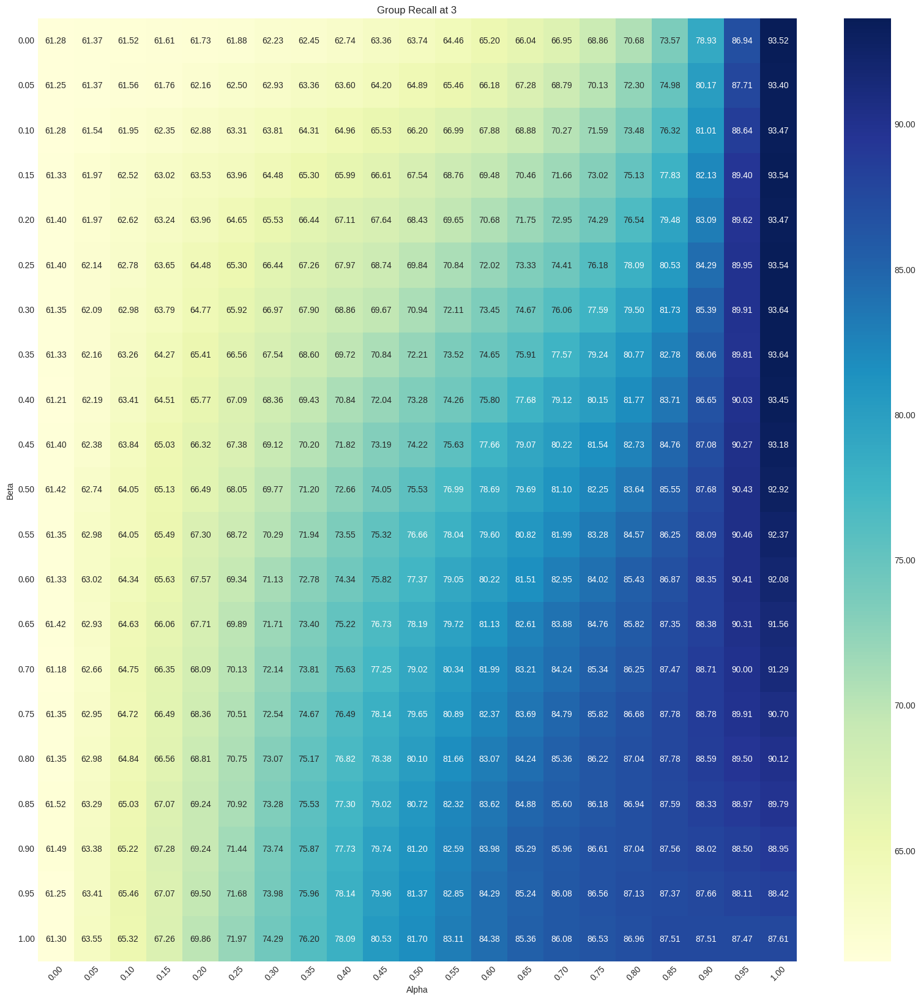

In [18]:
prepare_and_plot_recall_pivot(group_recall_at3, 'Group Recall at 3')

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 5: View some sample of the result</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compute the results</div>

In [19]:
sorted_indices, image_index_names, target_names = compute_results_cirr_val(
    get_combing_function_with_alpha(0.95),
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0.2,
    cache=cache,
)

Recall Results
Recall at 1: 29.16
Recall at 5: 61.52
Recall at 10: 75.03
Recall at 50: 92.66
Group Recall Results
Group Recall at 1: 56.23
Group Recall at 2: 77.92
Group Recall at 3: 89.62


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Prepare the ground truth data</div>

In [20]:
ground_truth = prepare_ground_truths(json.load(open('../../../cirr_dataset/cirr/captions/cap.rc2.val.json')))

DATASET_IMAGE_DIR = '../../../cirr_dataset/dev/'

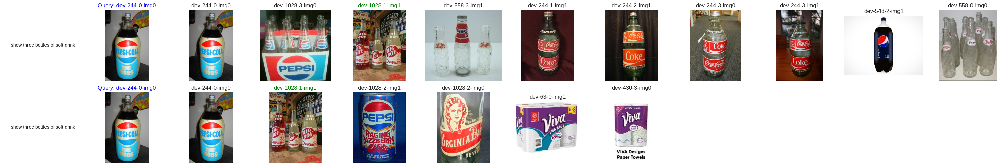

In [21]:
plot_retrieval_results_of_i(
    sorted_indices, 
    image_index_names, 
    target_names, 
    ground_truth, 
    top_k=10, 
    i=0,
    directory=DATASET_IMAGE_DIR,
)

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 6: Compare with the original without MMLM captions and identical weights element-wise sum</div>

## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [22]:
sorted_indices_origin, image_index_names_origin, target_names_origin = compute_results_cirr_val(
    combining_function_original,
    blip_text_encoder,
    blip_img_encoder,
    text_captions,
    preprocess,
    beta=0,
    cache=cache,
)

Recall Results
Recall at 1: 7.77
Recall at 5: 27.94
Recall at 10: 40.16
Recall at 50: 68.93
Group Recall Results
Group Recall at 1: 22.03
Group Recall at 2: 43.79
Group Recall at 3: 63.74


## <div style="font-family: 'Lucida Sans Unicode', sans-serif; font-size: 18px; color: #4A235A; background-color: #D7BDE2; text-align: left; padding: 10px; border-left: 5px solid #7D3C98; box-shadow: 0 4px 6px rgba(0, 0, 0, 0.2); margin-bottom: 10px;">Compare the results</div>

In [23]:
become_better = found_better_than_original(
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    sorted_indices, image_index_names, target_names,
    top_k=10
)

len(become_better), become_better[:10]

(1517, [0, 6, 12, 14, 19, 29, 30, 32, 41, 42])

In [24]:
become_worse = found_better_than_original(
    sorted_indices, image_index_names, target_names,
    sorted_indices_origin, image_index_names_origin, target_names_origin,
    top_k=10
)

len(become_worse), become_worse[:10]

(59, [4, 24, 26, 47, 288, 330, 335, 593, 631, 654])

# <div style="font-family: 'Garamond', serif; font-size: 22px; color: #ffffff; background-color: #34568B; text-align: center; padding: 15px; border-radius: 10px; border: 2px solid #FF6F61; box-shadow: 0 6px 12px rgba(0, 0, 0, 0.3); margin-bottom: 20px;">Step 7: Visualize the comparison</div>

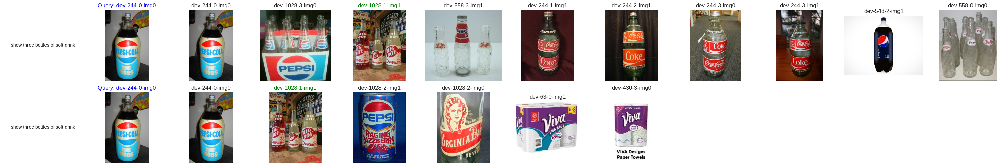

In [25]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=0)

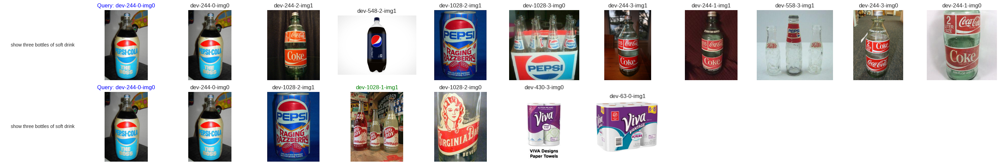

In [26]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=0)

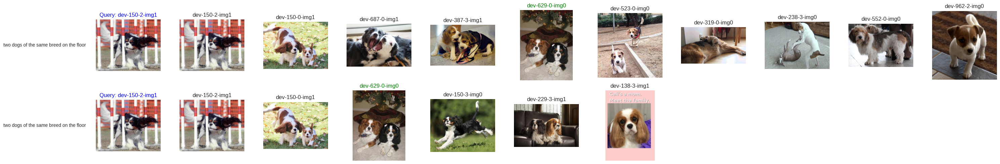

In [27]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=6)

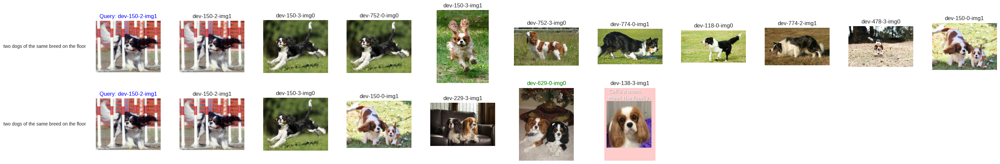

In [28]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=6)

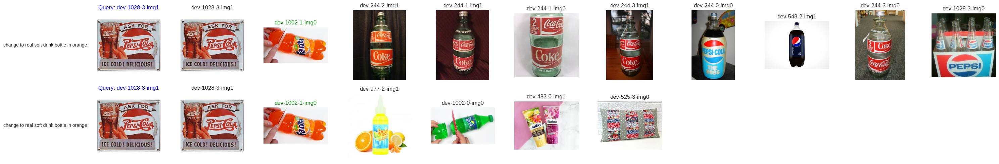

In [29]:
plot_retrieval_results_of_i(sorted_indices, image_index_names, target_names, ground_truth, top_k=10, i=19)

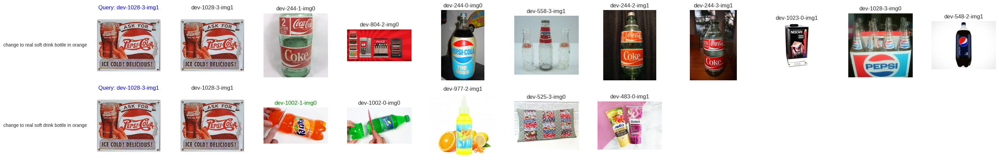

In [30]:
plot_retrieval_results_of_i(sorted_indices_origin, image_index_names_origin, target_names_origin, ground_truth, top_k=10, i=19)